# **<h1><center>DIP ASSIGNMENT 4</center></h1>**

# (1) Image Denoising:

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Read the noisy image
image_path = 'images/building_noisy.png'
noisy_img = cv2.imread(image_path, 0)  # 0 to read image in grayscale mode


In [2]:
def bilateral_filter(image, diameter, sigma_i, sigma_s):
    """
    Apply a bilateral filter to an image using the given parameters.

    Parameters:
    - image: input image
    - diameter: diameter of the pixel neighborhood
    - sigma_i: filter sigma in the intensity domain
    - sigma_s: filter sigma in the spatial domain

    Returns:
    - filtered_image: image after applying the bilateral filter
    """
    
    # Convert image to a floating point type for precision
    img = image.astype(np.float32)
    
    # Initialize the filtered image
    filtered_image = np.zeros_like(img)
    
    # Calculate the half size of the filter
    half_size = diameter // 2
    
    # Iterate over each pixel in the image
    for i in range(half_size, img.shape[0] - half_size):
        for j in range(half_size, img.shape[1] - half_size):
            
            # Extract the region of interest
            region = img[i-half_size:i+half_size+1, j-half_size:j+half_size+1]
            
            # Calculate the Gaussian intensity weights
            i_weights = np.exp(-((region - img[i, j]) ** 2) / (2 * sigma_i ** 2))
            
            # Calculate the spatial weights
            y, x = np.indices((diameter, diameter)) - half_size
            s_weights = np.exp(-(x**2 + y**2) / (2 * sigma_s ** 2))
            
            # Combine the spatial and intensity weights
            weights = i_weights * s_weights
            
            # Normalize the weights
            weights /= weights.sum()
            
            # Apply the weights to the region
            filtered_value = (weights * region).sum()
            
            # Assign the filtered value to the output image
            filtered_image[i, j] = filtered_value
    
    # Clip the values to be in the 8-bit range and convert back to uint8
    filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)
    
    return filtered_image



In [3]:
def gaussian_filtered(image, kernel_size, sigma):
    """
    Apply a Gaussian filter to an image.

    Parameters:
    - image: input image
    - kernel_size: size of the Gaussian kernel
    - sigma: standard deviation of the Gaussian kernel

    Returns:
    - gaussian_img: image after applying the Gaussian filter
    """
    # Create a Gaussian kernel. The kernel coefficients are based on the spatial distance from the center.
    d = kernel_size // 2
    y, x = np.mgrid[-d:d+1, -d:d+1]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    gaussian_kernel = g / g.sum()

    # Filter the image using convolution
    gaussian_img = cv2.filter2D(image, -1, gaussian_kernel)  # -1: depth of 8-bit (depth) unsigned integers, 
                                                            #indicates that the output image  will have the same depth as the source image
    
    return gaussian_img


def apply_laplacian(img):
    """
    Apply a Laplacian filter to an image .
    
    Parameters:
    - img: input image

    Returns:
    - laplacian_img: image after applying the Laplacian filter
    """
    # Check if image is a valid NumPy array
    if not isinstance(img, np.ndarray):
        raise TypeError("Input must be a NumPy array.")
    
    # Convert image to float32 if it's not already
    img_float = np.float32(img)
    
    # Define the Laplacian kernel
    kernel = np.array([[0, 1, 0],
                       [1, -4, 1],
                       [0, 1, 0]], dtype=np.float32)
    
    # Apply the kernel using a convolution operation, with border handling
    laplacian_img = cv2.filter2D(img_float, -1, kernel, borderType=cv2.BORDER_DEFAULT)  # to handle border effects.
    
    # Scale and convert to uint8
    laplacian_img = cv2.convertScaleAbs(laplacian_img) #  to scale the floating-point image and convert back to an 8-bit image
    
    return laplacian_img
    


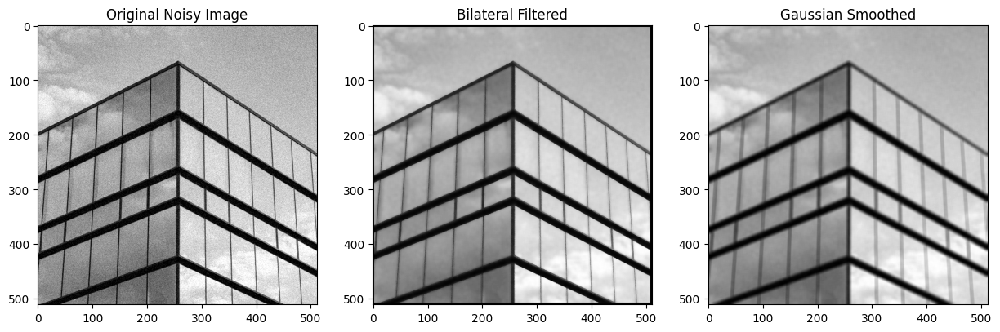

In [4]:

# Let's test the custom bilateral filter with the same parameters used before
bilateral_filtered_image = bilateral_filter(noisy_img, diameter=7, sigma_i=75, sigma_s=75)

# Apply the custom Gaussian filter with the same parameters used before
gaussian_smoothed_image = gaussian_filtered(noisy_img, kernel_size=7, sigma=75)

# Display the original noisy, bilateral filtered, and Gaussian smoothed images side by side
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.title('Original Noisy Image')
plt.imshow(noisy_img, cmap='gray')

plt.subplot(132)
plt.title('Bilateral Filtered')
plt.imshow(bilateral_filtered_image, cmap='gray')

plt.subplot(133)
plt.title('Gaussian Smoothed')
plt.imshow(gaussian_smoothed_image, cmap='gray')

save_path = "output/Q1_1.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')

plt.show()


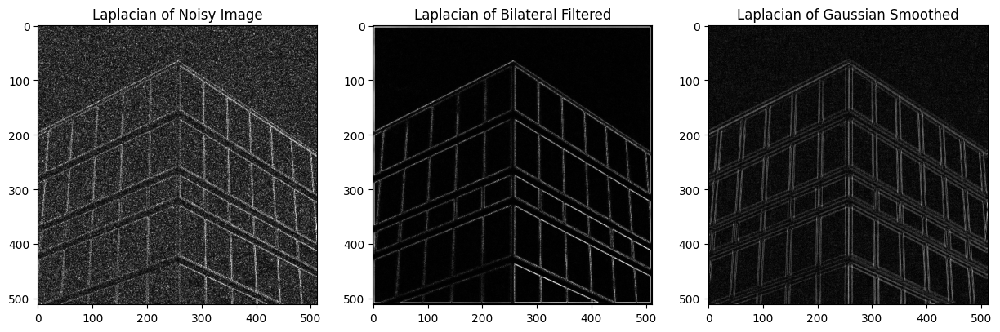

In [5]:

# Now we'll apply the custom Laplacian filter to all three images and plot them side by side
laplacian_noisy = apply_laplacian(noisy_img)
laplacian_bilateral = apply_laplacian(bilateral_filtered_image)
laplacian_gaussian = apply_laplacian(gaussian_smoothed_image)

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.title('Laplacian of Noisy Image')
plt.imshow(laplacian_noisy, cmap='gray')

plt.subplot(132)
plt.title('Laplacian of Bilateral Filtered')
plt.imshow(laplacian_bilateral, cmap='gray')

plt.subplot(133)
plt.title('Laplacian of Gaussian Smoothed')
plt.imshow(laplacian_gaussian, cmap='gray')

save_path = "output/Q1_2.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')

plt.show()


# (2) Edge Detection:

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Read images
arch_noisy1 = np.array(Image.open('images/architecture_noisy1.png').convert('L'))
arch_noisy2 = np.array(Image.open('images/architecture_noisy2.png').convert('L'))
book_noisy1 = np.array(Image.open('images/book_noisy1.png').convert('L'))
book_noisy2 = np.array(Image.open('images/book_noisy2.png').convert('L'))



In [7]:
from scipy.signal import convolve2d
import numpy as np

def gaussian_filter(size: int, sigma: float) -> np.ndarray:
    """
    Create a Gaussian filter.
    
    Parameters:
    - size: Size of the filter (size x size).
    - sigma: Standard deviation for the Gaussian distribution.
    
    Returns:
    - Gaussian filter of specified size and sigma.
    """
    # Create a size x size grid of coordinates
    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    g = np.exp(-((x**2 + y**2) / (2.0 * sigma**2)))
    return g / g.sum()

def apply_filter(image: np.ndarray, filter_: np.ndarray) -> np.ndarray:
    """
    Apply the given filter to the image using convolution.
    
    Parameters:
    - image: Input image.
    - filter_: Filter to be applied.
    
    Returns:
    - Filtered image.
    """
    return convolve2d(image, filter_, mode='same', boundary='symm')


In [8]:

# Gaussian filter parameters
filter_size = 5
sigma_value = 1.0

# Create Gaussian filter
gaussian_filter_ = gaussian_filter(filter_size, sigma_value)

# Apply Gaussian filter to the images
arch_noisy1_smoothed = apply_filter(arch_noisy1, gaussian_filter_)
arch_noisy2_smoothed = apply_filter(arch_noisy2, gaussian_filter_)
book_noisy1_smoothed = apply_filter(book_noisy1, gaussian_filter_)
book_noisy2_smoothed = apply_filter(book_noisy2, gaussian_filter_)



In [9]:
def sobel_operator(image: np.ndarray) -> np.ndarray:
    """
    Apply the Sobel operator to detect edges in the image.
    
    Parameters:
    - image: Input image.
    
    Returns:
    - Gradient magnitude of the image.
    """
    # Sobel kernels
    kernel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    kernel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
    
    # Convolve image with Sobel kernels
    gradient_x = convolve2d(image, kernel_x, mode='same', boundary='symm')
    gradient_y = convolve2d(image, kernel_y, mode='same', boundary='symm')
    
    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
    
    return gradient_magnitude



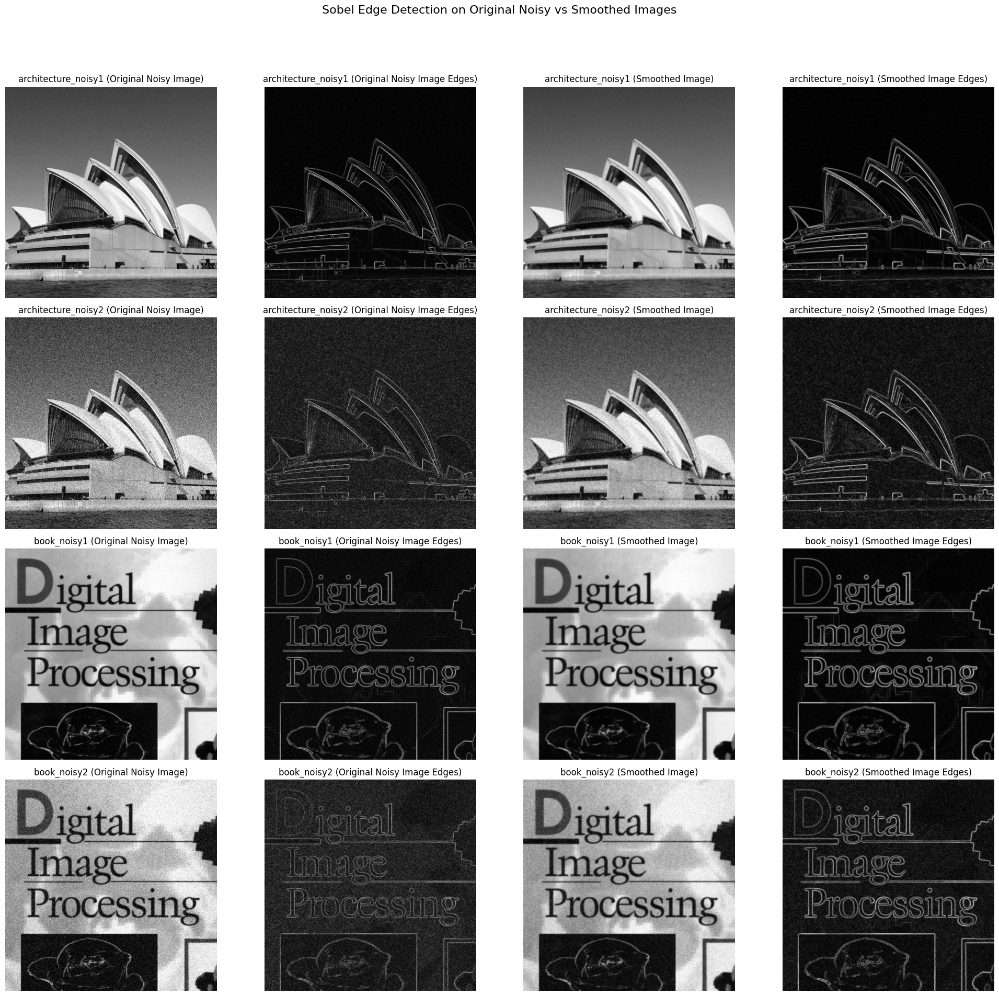

In [10]:
# Displaying a 4x4 grid of Sobel edge detection on original vs smoothed images side by side

# original input images
original_images = [arch_noisy1, arch_noisy2, book_noisy1, book_noisy2]


# Apply Sobel operator directly to the original images (without Gaussian smoothing)
sobel_results_original = [sobel_operator(img) for img in original_images]

# Apply Sobel operator to the smoothed images
smoothed_images = [arch_noisy1_smoothed, arch_noisy2_smoothed, book_noisy1_smoothed, book_noisy2_smoothed]  # sigma = 1
sobel_results_smoothed = [sobel_operator(img) for img in smoothed_images]


# Image titles

image_titles = ["architecture_noisy1", "architecture_noisy2", "book_noisy1", "book_noisy2"]

# Plot the results in a 4x4 grid
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
fig.suptitle('Sobel Edge Detection on Original Noisy vs Smoothed Images\n', fontsize=16)

for i in range(4):
    # Original images for reference
    axs[i, 0].imshow(original_images[i], cmap='gray')
    axs[i, 0].set_title(f'{image_titles[i]} (Original Noisy Image)')
    axs[i, 0].axis('off')
    
    # Original images Sobel results
    axs[i, 1].imshow(sobel_results_original[i], cmap='gray')
    axs[i, 1].set_title(f'{image_titles[i]} (Original Noisy Image Edges)')
    axs[i, 1].axis('off')

     # Smoothed images for reference
    axs[i, 2].imshow(smoothed_images[i], cmap='gray')
    axs[i, 2].set_title(f'{image_titles[i]} (Smoothed Image)')
    axs[i, 2].axis('off')


    # Smoothed images Sobel results
    axs[i, 3].imshow(sobel_results_smoothed[i], cmap='gray')
    axs[i, 3].set_title(f'{image_titles[i]} (Smoothed Image Edges)')
    axs[i, 3].axis('off')

 

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

save_path = "output/Q2_1.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()


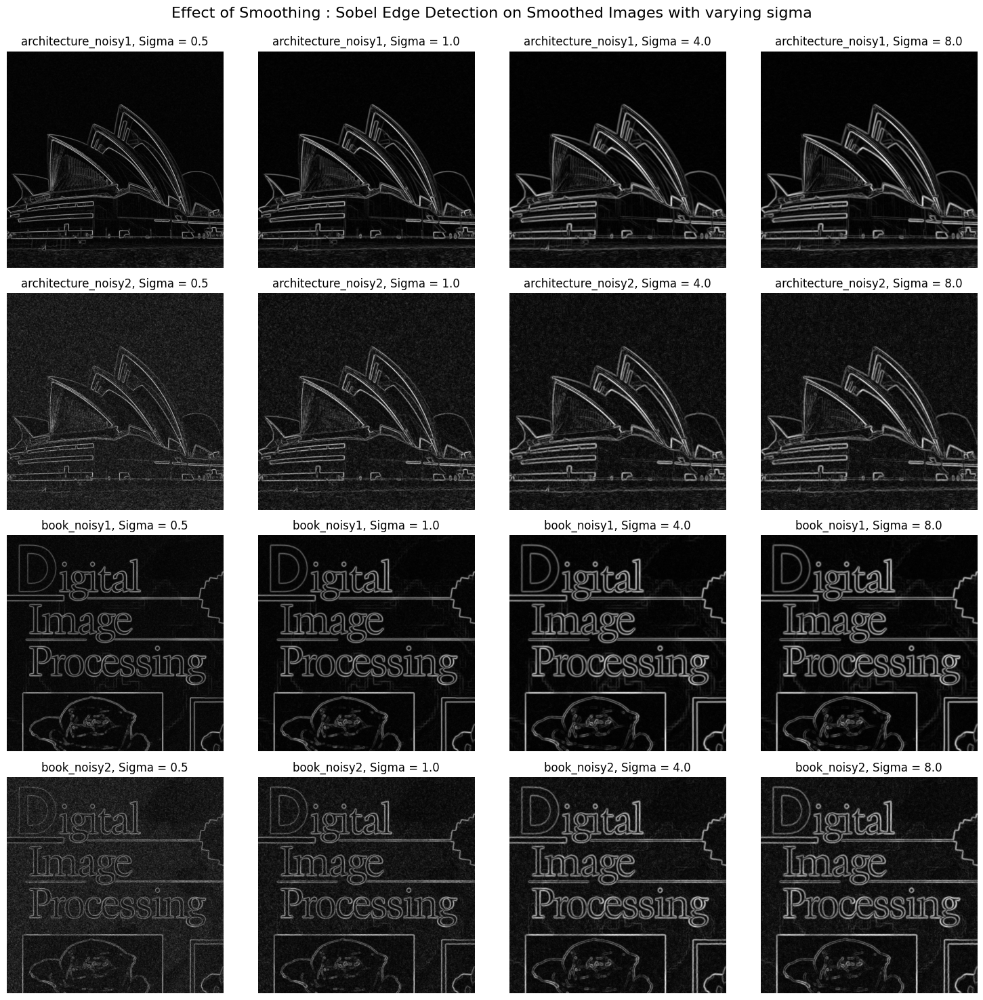

In [11]:


# original input images
original_images = [arch_noisy1, arch_noisy2, book_noisy1, book_noisy2]

# Different sigma values for Gaussian smoothing
sigma_values = [0.5, 1.0, 4.0, 8.0]

# Edges on Smoothed images
smoothed_edged_results = [[sobel_operator(apply_filter(img, gaussian_filter(5, sigma))) for sigma in sigma_values] for img in original_images]



# Plot the 4x4 grid for edge-detected on smoothed images
fig, axs = plt.subplots(4, 4, figsize=(15, 15))
fig.suptitle('Effect of Smoothing : Sobel Edge Detection on Smoothed Images with varying sigma\n', fontsize=16)
for i, row in enumerate(smoothed_edged_results):
    for j, img in enumerate(row):
        axs[i, j].imshow(img, cmap='gray')
        axs[i, j].set_title(f'{image_titles[i]}, Sigma = {sigma_values[j]}')  
        axs[i, j].axis('off')

plt.tight_layout()

save_path = "output/Q2_2.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()


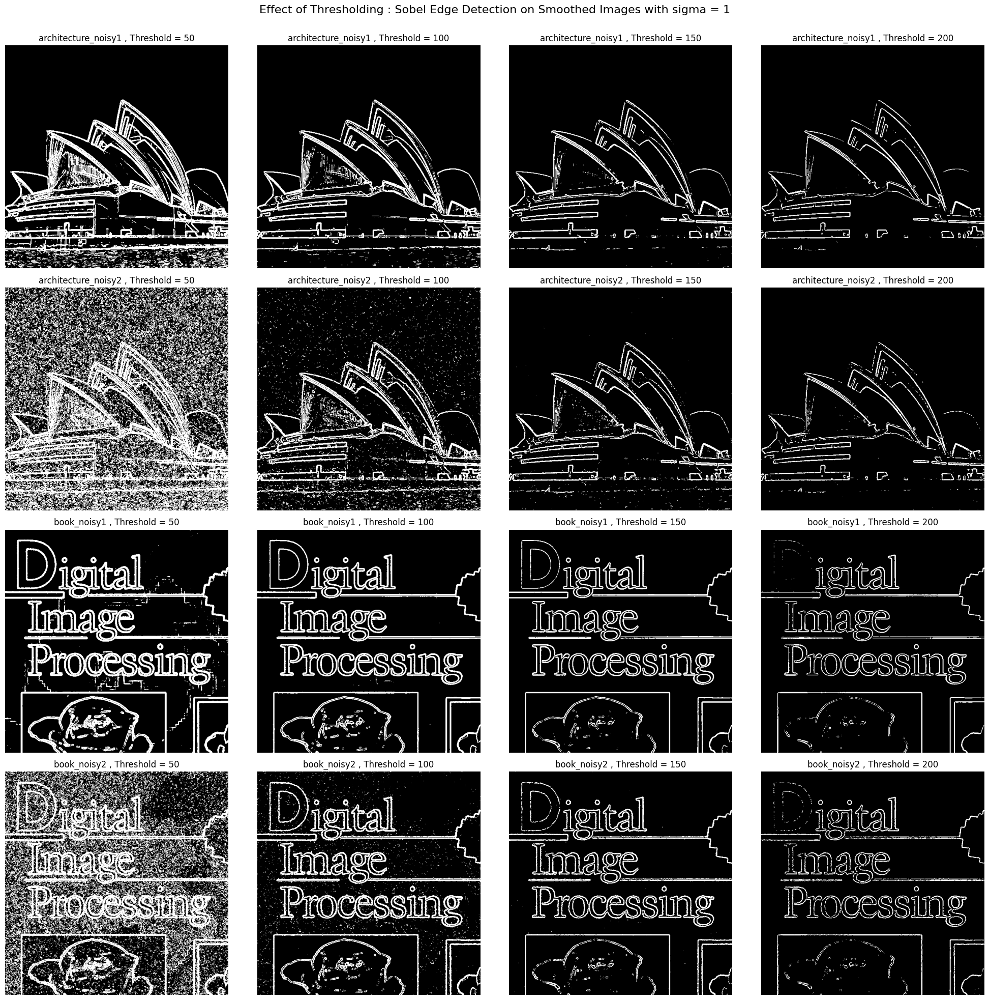

In [12]:

def threshold_image(image: np.ndarray, threshold: float) -> np.ndarray:
    """
    Apply thresholding to the image.
    
    Parameters:
    - image: Input image.
    - threshold: Threshold value.
    
    Returns:
    - Thresholded binary image.
    """
    # If the pixel's value is higher than the threshold, it's marked as an edge (often represented by a pixel value of 1 or 255).
    # If it's lower, it's considered non-edge (marked as 0).
    return (image > threshold).astype(int)




# Gaussian Smoothed Images
smoothed_images = [arch_noisy1_smoothed, arch_noisy2_smoothed, book_noisy1_smoothed, book_noisy2_smoothed] # sigma = 1

# Edges on Smoothed images 
smoothed_edged_results = [sobel_operator(img) for img in smoothed_images]
# Now, let's create the 4x4 grid of results 

# Thresholding the edge-detected images
threshold_values = [50, 100, 150, 200]
thresholded_results = [[threshold_image(img, thresh) for thresh in threshold_values] for img in smoothed_edged_results]


# Plot the results for both codes
fig, axs = plt.subplots(4, 4, figsize=(20, 20))
fig.suptitle('Effect of Thresholding : Sobel Edge Detection on Smoothed Images with sigma = 1\n\n', fontsize=16)
# Plotting for Code 1
for i, row in enumerate(thresholded_results):
    for j, img in enumerate(row):
        axs[i, j].imshow(img, cmap='gray')
        axs[i, j].set_title(f'{image_titles[i]} , Threshold = {threshold_values[j]}')
        axs[i, j].axis('off')


plt.tight_layout()

save_path = "output/Q2_3.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()



# (3) Hough Transform: 

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Create a synthetic image
def create_synthetic_image():
    image = np.zeros((400, 400), dtype=np.uint8)  # Create a black canvas  400x400 resolution
    image = cv2.line(image, (50, 50), (350, 350), 255, 5)  # Add a line
    image = cv2.rectangle(image, (100, 100), (300, 300), 255, 5)  # Add a rectangle
    image = cv2.circle(image, (200, 200), 50, 255, 5)  # Add a circle
    return image

# Perform edge detection
def edge_detection(image):
    # Convert the image to grayscale
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian Blur
    blur = cv2.GaussianBlur(image, (5, 5), 0)
    # Apply Canny edge detector
  #  edges =  cv2.Canny(image, 50, 150)
    edges = cv2.Canny(blur, 50, 150)
    return edges


def hough_line_transform(edge_image, num_theta_bins, num_rho_bins):
    # Theta range is from -90 to 90 degrees
    thetas = np.deg2rad(np.linspace(-90.0, 90.0, num_theta_bins, endpoint=False))
    
    # Calculate the maximum distance possible (diagonal of the image)
    width, height = edge_image.shape
    diag_len = int(np.ceil(np.sqrt(width ** 2 + height ** 2)))
    
    # Rho ranges from -diag_len to diag_len
    rhos = np.linspace(-diag_len, diag_len, num_rho_bins)
    
    # Create the Hough accumulator array of theta vs rho
    accumulator = np.zeros((num_rho_bins, num_theta_bins), dtype=np.uint64)  # (2 * diag_len, len(thetas))
    
    # Get x, y indices of all non-zero pixels (edge points)
    y_idxs, x_idxs = np.nonzero(edge_image)
    
    # Cast votes in the Hough accumulator array
    for i in range(len(x_idxs)):
        x = x_idxs[i]
        y = y_idxs[i]
        for t_idx in range(num_theta_bins):
         # Calculate rho. "+ diag_len" shifts the range of rho to positive
            rho_val = x * np.cos(thetas[t_idx]) + y * np.sin(thetas[t_idx])
            rho_idx = np.round((rho_val + diag_len) * (num_rho_bins - 1) / (2 * diag_len)).astype(int)
            accumulator[rho_idx, t_idx] += 1

    return accumulator, thetas, rhos





# Detect lines in the accumulator
def detect_lines(accumulator, thetas, rhos, threshold):
    lines = []
    for r_idx in range(accumulator.shape[0]):
        for t_idx in range(accumulator.shape[1]):
            if accumulator[r_idx, t_idx] > threshold:
                rho = rhos[r_idx]
                theta = thetas[t_idx]
                lines.append((rho, theta))
    return lines


def draw_lines_colored(image, lines):
    # Check if the image is grayscale
    if len(image.shape) == 2:
        # Convert the grayscale image to BGR
        color_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    else:
        # Use the color image directly
        color_image = np.copy(image)

    for rho, theta in lines:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000 * (-b)), int(y0 + 1000 * (a)))
        pt2 = (int(x0 - 1000 * (-b)), int(y0 - 1000 * (a)))
#        cv2.line(color_image, pt1, pt2, (0, 0, 255), 2)  # Draw red lines
        cv2.line(color_image, pt1, pt2, (0, 255, 0), 2)  # Draw green lines

    return color_image





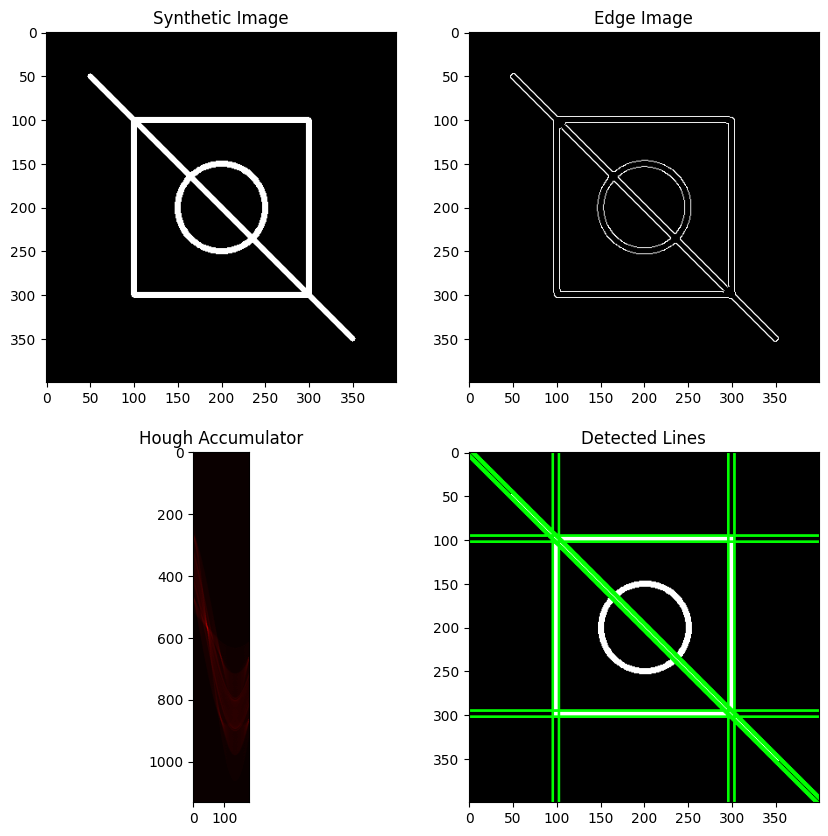

In [14]:
# Hyperparameters for coarser (low) resolution: lower number of bins
num_theta_bins = 180  # -90 to 89
num_rho_bins = 1132  # approximately 2*diag_len = 2*566 = 1132
threshold = 150


# Hyperparameters for finer resolution : higher number of bins
# num_theta_bins = 360
# num_rho_bins = 2160
# threshold = 150


synthetic_image = create_synthetic_image()  # grayscale image
edge_image = edge_detection(synthetic_image)

# Using a higher number of bins for finer resolution
#accumulator_fine, thetas_fine, rhos_fine = hough_line_transform(edge_image, num_theta_bins, num_rho_bins)

# Using a lower number of bins for coarser resolution
accumulator, thetas, rhos = hough_line_transform(edge_image, num_theta_bins, num_rho_bins)



# hough lines detection
lines = detect_lines(accumulator, thetas, rhos, threshold)


# Draw lines on a color version of the original image
line_image_colored = draw_lines_colored(synthetic_image, lines)

plt.figure(figsize=(10, 10))
plt.subplot(221), plt.imshow(synthetic_image, cmap='gray'), plt.title('Synthetic Image')
plt.subplot(222), plt.imshow(edge_image, cmap='gray'), plt.title('Edge Image')
plt.subplot(223), plt.imshow(accumulator, cmap='hot'), plt.title('Hough Accumulator')
plt.subplot(224), plt.imshow(cv2.cvtColor(line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines')


save_path = "output/Q3_1.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')

plt.show()

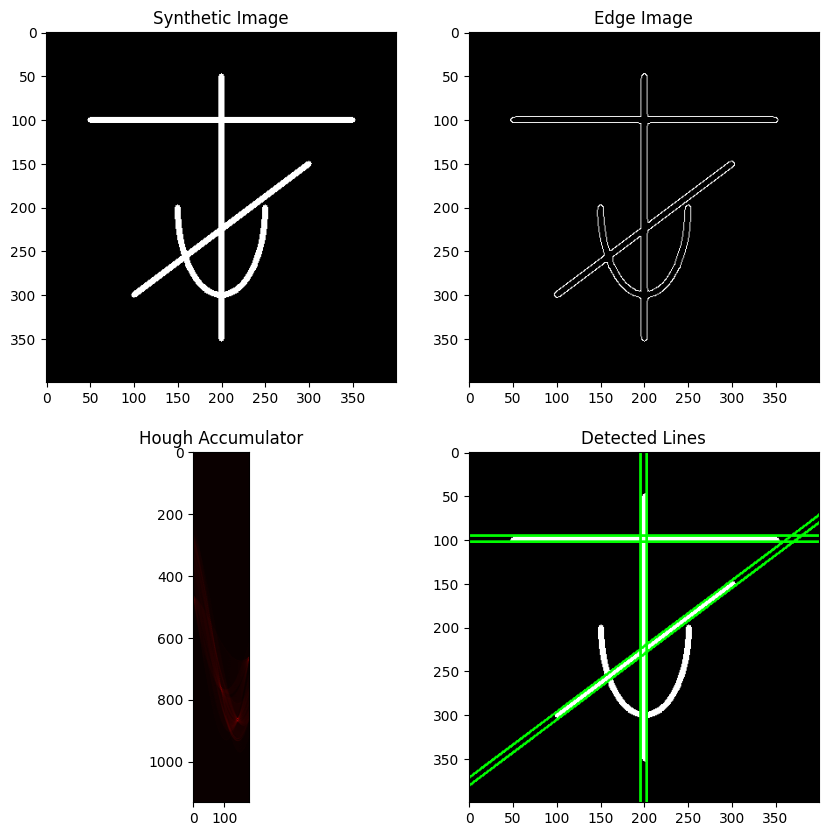

In [15]:
# Create a different synthetic image
def create_another_synthetic_image():
    # Start with a blank black image
    image = np.zeros((400, 400), dtype=np.uint8)
    
    # Draw a horizontal line
    image = cv2.line(image, (50, 100), (350, 100), 255, 5)
    
    # Draw a vertical line
    image = cv2.line(image, (200, 50), (200, 350), 255, 5)
    
    # Draw a diagonal line
    image = cv2.line(image, (100, 300), (300, 150), 255, 5)
    
    # Draw an ellipse
    image = cv2.ellipse(image, (200, 200), (50, 100), 0, 0, 180, 255, 5)
    
    return image



# Create a different synthetic image and detect edges
another_synthetic_image = create_another_synthetic_image()
edge_image = edge_detection(another_synthetic_image)
    
# Perform the Hough line transform and detect lines
# Using a lower number of bins for coarser resolution
accumulator, thetas, rhos = hough_line_transform(edge_image, num_theta_bins, num_rho_bins)

# hough lines detection
lines = detect_lines(accumulator, thetas, rhos, threshold)


# Draw lines on a color version of the original image
line_image_colored = draw_lines_colored(another_synthetic_image, lines)

plt.figure(figsize=(10, 10))
plt.subplot(221), plt.imshow(another_synthetic_image, cmap='gray'), plt.title('Synthetic Image')
plt.subplot(222), plt.imshow(edge_image, cmap='gray'), plt.title('Edge Image')
plt.subplot(223), plt.imshow(accumulator, cmap='hot'), plt.title('Hough Accumulator')
plt.subplot(224), plt.imshow(cv2.cvtColor(line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines')



save_path = "output/Q3_2.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()

## (i) Lower level of Noise and Occlusion

In [16]:

# Function to add random noise to the image
def add_noise(image, noise_level):
    # Ensure the noise is only additive by using absolute values
    noise = np.abs(np.random.randint(-noise_level//2, noise_level//2, image.shape, dtype=np.int16))
    noisy_image = cv2.add(image.astype(np.int16), noise.astype(np.int16))  # Use int16 to avoid overflow
    np.clip(noisy_image, 0, 255, out=noisy_image)  # Ensure values are valid in uint8 range
    return noisy_image.astype(np.uint8)

# Function to add occlusions to the image
def add_occlusions(image, occlusion_size):
    occluded_image = image.copy()  # Create a copy to not modify the original image
    # Randomly create occlusion coordinates
    for _ in range(5):  # Example: add 5 occlusions
        y, x = np.random.randint(0, image.shape[0]-occlusion_size, 2)
        occluded_image[y:y+occlusion_size, x:x+occlusion_size] = 255  # white square occlusion
    return occluded_image

#  Include noise and occlusion analysis
# Create a synthetic image
synthetic_image = create_synthetic_image()


#hyperparameters
threshold = 150
noise_level = 5  # small
occlusion_size = 50  # small

# Add noise and occlusions to the synthetic image
noisy_image = add_noise(synthetic_image, noise_level)
occluded_image = add_occlusions(synthetic_image, occlusion_size)

# Detect edges
edge_image = edge_detection(synthetic_image)
noisy_edge_image = edge_detection(noisy_image)
occluded_edge_image = edge_detection(occluded_image)


# Perform line detection on  original synthetic image
accumulator, thetas, rhos = hough_line_transform(edge_image, num_theta_bins, num_rho_bins)
lines = detect_lines(accumulator, thetas, rhos, threshold)
line_image_colored = draw_lines_colored(synthetic_image, lines)

# Perform line detection on noisy and occluded images
noisy_accumulator, _, _ = hough_line_transform(noisy_edge_image, num_theta_bins, num_rho_bins)
noisy_lines = detect_lines(noisy_accumulator, thetas, rhos, threshold)
noisy_line_image_colored = draw_lines_colored(noisy_image, noisy_lines)

occluded_accumulator, _, _ = hough_line_transform(occluded_edge_image, num_theta_bins, num_rho_bins)
occluded_lines = detect_lines(occluded_accumulator, thetas, rhos, threshold)
occluded_line_image_colored = draw_lines_colored(occluded_image, occluded_lines)



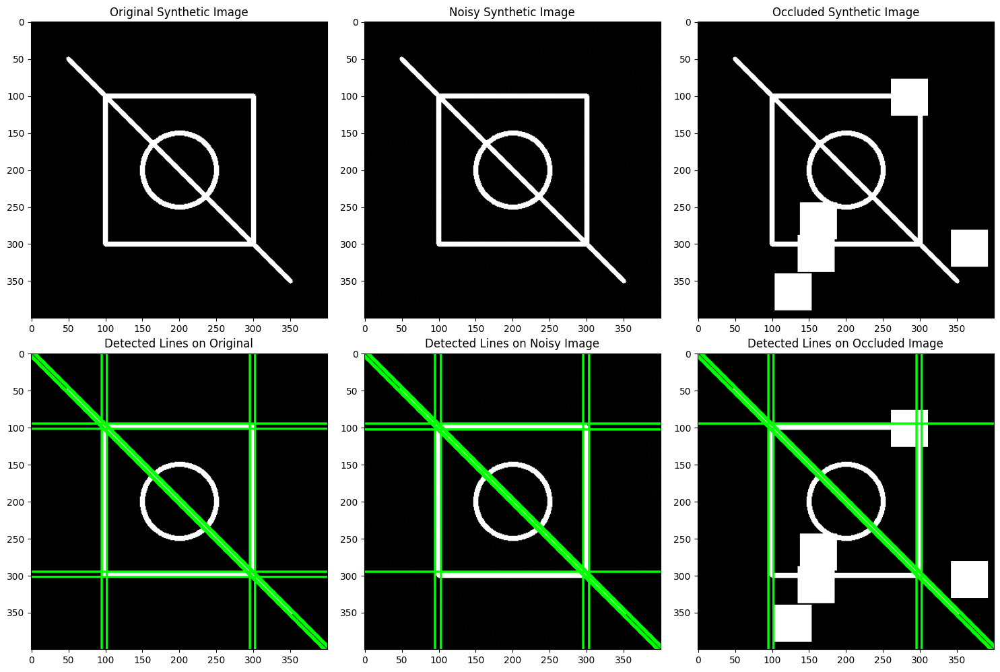

In [17]:
# Display the results
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Original synthetic image
plt.subplot(231), plt.imshow(synthetic_image, cmap='gray'), plt.title('Original Synthetic Image')
plt.subplot(234), plt.imshow(cv2.cvtColor(line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Original')

# Noisy synthetic image
plt.subplot(232), plt.imshow(noisy_image, cmap='gray'), plt.title('Noisy Synthetic Image')
plt.subplot(235), plt.imshow(cv2.cvtColor(noisy_line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Noisy Image')

# Occluded synthetic image
plt.subplot(233), plt.imshow(occluded_image, cmap='gray'), plt.title('Occluded Synthetic Image')
plt.subplot(236), plt.imshow(cv2.cvtColor(occluded_line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Occluded Image')

plt.tight_layout()  # Adjust the spacing between plots


save_path = "output/Q3_3.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()


## (ii) Higher (Increased) level of Noise and Occlusion

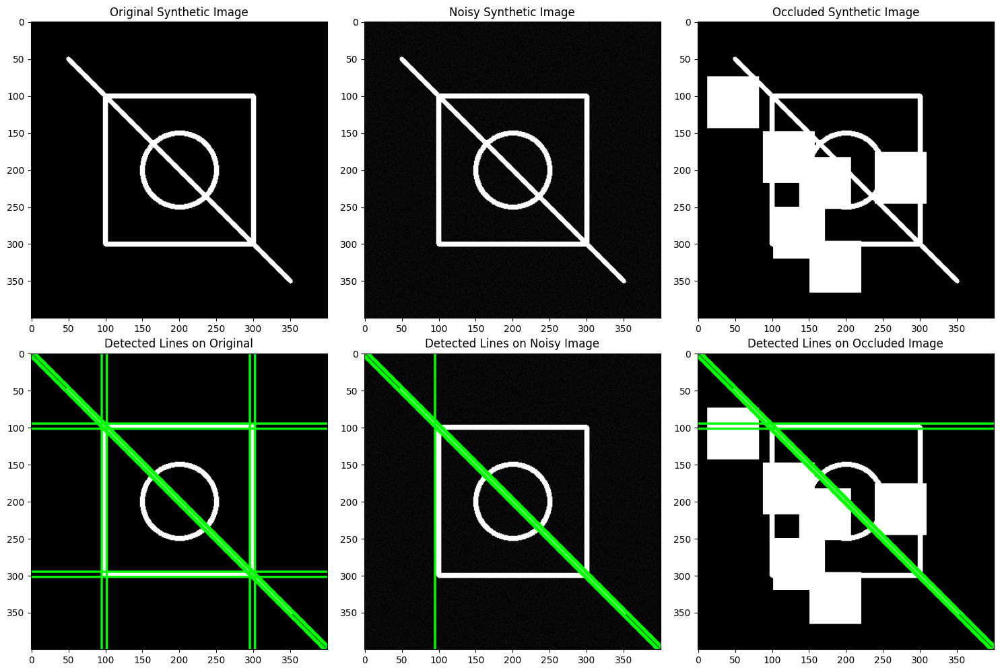

In [18]:



# Function to add random noise to the image
def add_noise(image, noise_level):
    # Ensure the noise is only additive by using absolute values
    noise = np.abs(np.random.randint(-noise_level//2, noise_level//2, image.shape, dtype=np.int16))
    noisy_image = cv2.add(image.astype(np.int16), noise.astype(np.int16))  # Use int16 to avoid overflow
    np.clip(noisy_image, 0, 255, out=noisy_image)  # Ensure values are valid in uint8 range
    return noisy_image.astype(np.uint8)

# Function to add occlusions to the image
def add_occlusions(image, occlusion_size):
    occluded_image = image.copy()  # Create a copy to not modify the original image
    # Randomly create occlusion coordinates
    for _ in range(6):  # Example: add 6 occlusions
        y, x = np.random.randint(0, image.shape[0]-occlusion_size, 2)
        occluded_image[y:y+occlusion_size, x:x+occlusion_size] = 255  # black square occlusion
    return occluded_image

#  Include noise and occlusion analysis
# Create a synthetic image
synthetic_image = create_synthetic_image()


#hyperparameters
threshold = 150
noise_level = 30   # increase
occlusion_size = 70  # increase

# Add noise and occlusions to the synthetic image
noisy_image = add_noise(synthetic_image, noise_level)
occluded_image = add_occlusions(synthetic_image, occlusion_size)

# Detect edges
edge_image = edge_detection(synthetic_image)
noisy_edge_image = edge_detection(noisy_image)
occluded_edge_image = edge_detection(occluded_image)


# Perform line detection on  original synthetic image
accumulator, thetas, rhos = hough_line_transform(edge_image, num_theta_bins, num_rho_bins)
lines = detect_lines(accumulator, thetas, rhos, threshold)
line_image_colored = draw_lines_colored(synthetic_image, lines)

# Perform line detection on noisy and occluded images
noisy_accumulator, _, _ = hough_line_transform(noisy_edge_image, num_theta_bins, num_rho_bins)
noisy_lines = detect_lines(noisy_accumulator, thetas, rhos, threshold)
noisy_line_image_colored = draw_lines_colored(noisy_image, noisy_lines)

occluded_accumulator, _, _ = hough_line_transform(occluded_edge_image, num_theta_bins, num_rho_bins)
occluded_lines = detect_lines(occluded_accumulator, thetas, rhos, threshold)
occluded_line_image_colored = draw_lines_colored(occluded_image, occluded_lines)


# Display the results
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed

# Original synthetic image
plt.subplot(231), plt.imshow(synthetic_image, cmap='gray'), plt.title('Original Synthetic Image')
plt.subplot(234), plt.imshow(cv2.cvtColor(line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Original')

# Noisy synthetic image
plt.subplot(232), plt.imshow(noisy_image, cmap='gray'), plt.title('Noisy Synthetic Image')
plt.subplot(235), plt.imshow(cv2.cvtColor(noisy_line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Noisy Image')

# Occluded synthetic image
plt.subplot(233), plt.imshow(occluded_image, cmap='gray'), plt.title('Occluded Synthetic Image')
plt.subplot(236), plt.imshow(cv2.cvtColor(occluded_line_image_colored, cv2.COLOR_BGR2RGB)), plt.title('Detected Lines on Occluded Image')

plt.tight_layout()  # Adjust the spacing between plots



save_path = "output/Q3_4.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')
plt.show()


## (iii) Test on Real-World Images

(704, 1279, 3)


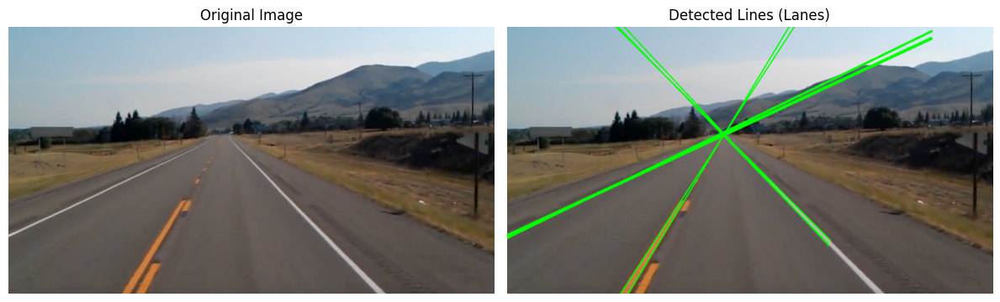

In [19]:
# Load a real image
real_image = cv2.imread("images/lane.png")  # image path   # RGB
print(real_image.shape)

# Convert to grayscale
gray_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2GRAY)

width, height = gray_image.shape
diag_len = int(np.ceil(np.sqrt(width ** 2 + height ** 2)))


# Hyperparameters for coarser (low) resolution: lower number of bins
num_theta_bins = 180  # -90 to 90
num_rho_bins = 2 * diag_len  # 2*diag_len
threshold = 185



# Apply edge detection
edges = edge_detection(gray_image)
    

# Apply Hough Line Transform
accumulator, thetas, rhos = hough_line_transform(edges, num_theta_bins, num_rho_bins)
lines = detect_lines(accumulator, thetas, rhos, threshold)  # Adjust threshold as needed : increase

# Draw lines on the original (or grayscale) image
#output_image = draw_lines_colored(gray_image, lines)
# Draw lines on the original RGB image
output_image = draw_lines_colored(real_image, lines)

# Displaying the images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.title('Detected Lines (Lanes)')
plt.axis('off')

plt.tight_layout()


save_path = "output/Q3_5.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')

plt.show()


(512, 512, 3)


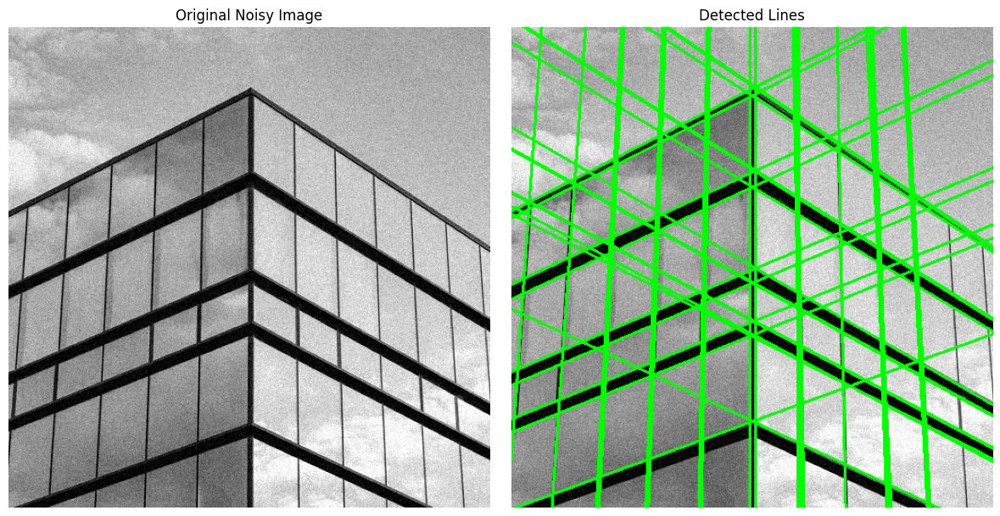

In [20]:
# Load a real image
real_image = cv2.imread("images/building_noisy.png")  # image path   # RGB
print(real_image.shape)

# Convert to grayscale
gray_image = cv2.cvtColor(real_image, cv2.COLOR_BGR2GRAY)

width, height = gray_image.shape
diag_len = int(np.ceil(np.sqrt(width ** 2 + height ** 2)))



# Hyperparameters for coarser (low) resolution: lower number of bins
num_theta_bins = 180  # -90 to 90
num_rho_bins = 2 * diag_len  # 2*diag_len
threshold = 150



# Apply edge detection
edges = edge_detection(gray_image)
    

# Apply Hough Line Transform
accumulator, thetas, rhos = hough_line_transform(edges, num_theta_bins, num_rho_bins)
lines = detect_lines(accumulator, thetas, rhos, threshold)  # Adjust threshold as needed : increase

# Draw lines on the original (or grayscale) image
#output_image = draw_lines_colored(gray_image, lines)
# Draw lines on the original RGB image
output_image = draw_lines_colored(real_image, lines)

# Displaying the images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(real_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.title('Original Noisy Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for displaying
plt.title('Detected Lines')
plt.axis('off')

plt.tight_layout()


save_path = "output/Q3_6.png"
plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi='figure')

plt.show()
